# Import Library

In [1]:
import pandas as pd
import numpy as np

import nltk
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords 
from nltk import pos_tag
from nltk.tag import pos_tag

import newspaper
from newspaper import Article

from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction import DictVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.cluster import KMeans

import re
import time
import string
import json
import operator
from collections import Counter

import matplotlib.pyplot as plt

import glob
import os

# Read Data

In [55]:
#belakangan
header = ["GlobalEventId", "sqldate", "MonthYear","Year",
               "Actor1Code","Actor1Name","Actor1CountryCode","Actor1KnownGroupCode","Actor1Type1Code",
               "Actor2Code","Actor2Name","Actor2CountryCode","Actor2KnownGroupCode","Actor2Type1Code",
               "IsRootEvent","EventCode","EventBaseCode","EventRootCode",
               "QuadClass","GoldsteinScale","NumMentions","NumSources","NumArticles","AvgTone",
               "Actor1Geo_FullName","Actor1Geo_CountryCode","Actor1Geo_ADM1Code","Actor1Geo_Lat","Actor1Geo_Long",
               "Actor2Geo_FullName","Actor2Geo_CountryCode","Actor2Geo_ADM1Code","Actor2Geo_Lat","Actor2Geo_Long",
               "ActionGeo_FullName","ActionGeo_CountryCode","ActionGeo_ADM1Code","ActionGeo_Lat","ActionGeo_Long",
               "SOURCEURL"]

In [56]:
#belakangan
#ubah path_clean sesuai tempat clean di lokal
path_clean = 'E:/digitalent/2018-clean.csv'
#path_clean = 'E:/digitalent-project/csv/2017-clean.csv'
data_gdelt = pd.read_csv(path_clean, delimiter = ',', encoding = "ISO-8859-1", names=header)
data_gdelt.sample(4)

,GlobalEventId,sqldate,MonthYear,Year,Actor1Code,Actor1Name,Actor1CountryCode,Actor1KnownGroupCode,Actor1Type1Code,Actor2Code,...,Actor2Geo_CountryCode,Actor2Geo_ADM1Code,Actor2Geo_Lat,Actor2Geo_Long,ActionGeo_FullName,ActionGeo_CountryCode,ActionGeo_ADM1Code,ActionGeo_Lat,ActionGeo_Long,SOURCEURL
129076,727777203,20180203,201802,2018,NaN,NaN,NaN,NaN,NaN,USA,...,US,USNV,38.4199,-117.12200,"Nevada, United States",US,USNV,38.4199,-117.12200,http://www.kcrg.com/content/news/Father-of-two...
418387,746588837,20180411,201804,2018,NaN,NaN,NaN,NaN,NaN,GBR,...,UK,UKD9,51.4888,-0.30479,"Ealing, Ealing, United Kingdom",UK,UKD9,51.4888,-0.30479,https://www.huffingtonpost.co.uk/entry/pro-lif...
957737,783245483,20170830,201708,2017,GOV,PRESIDENT,NaN,NaN,GOV,ECUGOV,...,BR,BR,-10.0000,-55.00000,Brazil,BR,BR,-10.0000,-55.00000,https://www.economist.com/the-americas/2018/09...
592929,758773290,20180524,201805,2018,NaN,NaN,NaN,NaN,NaN,USA,...,US,USKY,36.7534,-86.19050,"Scottsville, Kentucky, United States",US,USKY,36.7534,-86.19050,http://www.bgdailynews.com/news/man-accused-in...


### Inisialisasi Stopwords

In [2]:
stop_words = set(stopwords.words('english'))

### Inisialisasi Stemming

In [3]:
ps = nltk.stem.PorterStemmer()

### Inisialisasi dict res untuk menampung result

In [4]:
res = {}

## Looping txt File

## Mengolah txt File

In [5]:
# sebelum file json ada
def scrap_article(gid, source):
    start = time.time()
    myfile = open(source, 'r', encoding = 'utf-8')
    article = myfile.read()
    
    #LOWERCASE
    txt = article.lower()
    
    #change nonword to space   
    txt_clean = re.sub(r'[^a-zA-Z]', ' ', txt)
    
    #TOKENISASI , STEM, HAPUS PROPERNOUN, DAN HAPUS STOPWORD
    tagged_sentence = nltk.pos_tag(txt_clean.split())
    
    filtered_sentence=[]
    for initword, tag in tagged_sentence:
        word = ps.stem(initword)
        if len(word)>3 and (word not in stop_words) and tag != 'NNP' and tag != 'NNPS':
            filtered_sentence.append(word)

    #print("TOKENS",type(filtered_sentence))
    
    #COUNT VECTOR: hitung kemunculan tiap kata
    val = dict((Counter(filtered_sentence)))
    
    #masukkan hasil ke dict res dengan id : gid_str dan value: val
    res[gid] = val
    end = time.time()
    waktu = end-start
    myfile.close()
    #print(waktu)
    return val

In [65]:
start2=start =time.time()
progress = 0
lenart = 1000
for x in range(1000):
    global start
    global progress
    progress += 1
    try:
        sample_=data_gdelt['SOURCEURL'][x]
        sample_ID_ = data_gdelt['GlobalEventId'][x]
        aaa = scrap_article(sample_ID_, sample_)
        #print(aaa, type(aaa))
    except:
        print('gagal', sample_)
        pass
    end = time.time()
    if progress%10==0:
        print('\r {} percent, {} position, {} per second '.format(str(float(progress / lenart)), str(progress), (1 / (end - start)))) #lets us see how much time is 
end2 = time.time()

print('waktu',end2-start2)




 0.0002 percent, 10 position, 2.782309667062468 per second 
 0.0004 percent, 20 position, 1.3665107923396234 per second 
 0.0006 percent, 30 position, 1.0404144687002808 per second 
 0.0008 percent, 40 position, 0.7825075777772761 per second 
 0.001 percent, 50 position, 0.6823781220115582 per second 
 0.0012 percent, 60 position, 0.5509104007996423 per second 
 0.0014 percent, 70 position, 0.4647423620297775 per second 
 0.0016 percent, 80 position, 0.40606013901469107 per second 
 0.0018 percent, 90 position, 0.3521936108279006 per second 
 0.002 percent, 100 position, 0.3391285287246676 per second 
 0.0022 percent, 110 position, 0.32237662743625933 per second 
 0.0024 percent, 120 position, 0.29006989942759265 per second 
 0.0026 percent, 130 position, 0.24608865331907523 per second 
 0.0028 percent, 140 position, 0.22462189513799 per second 
 0.003 percent, 150 position, 0.21700476998204435 per second 
 0.0032 percent, 160 position, 0.20895632287440088 per second 
 0.0034 percent, 

 0.0266 percent, 1330 position, 0.027429650433069972 per second 
 0.0268 percent, 1340 position, 0.027261137018219025 per second 
 0.027 percent, 1350 position, 0.027084909149340485 per second 
 0.0272 percent, 1360 position, 0.026917841253698786 per second 
 0.0274 percent, 1370 position, 0.026812324557090775 per second 
 0.0276 percent, 1380 position, 0.026709605943357032 per second 
 0.0278 percent, 1390 position, 0.026587536297454657 per second 
 0.028 percent, 1400 position, 0.026513704091402055 per second 
 0.0282 percent, 1410 position, 0.026231425014566486 per second 
 0.0284 percent, 1420 position, 0.02613498395095553 per second 
 0.0286 percent, 1430 position, 0.025893324076122288 per second 
 0.0288 percent, 1440 position, 0.025506883063200113 per second 
 0.029 percent, 1450 position, 0.025415708963111506 per second 
 0.0292 percent, 1460 position, 0.0253296364326485 per second 
 0.0294 percent, 1470 position, 0.025157993373298614 per second 
 0.0296 percent, 1480 position,

 0.0522 percent, 2610 position, 0.014948611492793622 per second 
 0.0524 percent, 2620 position, 0.014887808351186079 per second 
 0.0526 percent, 2630 position, 0.01484291745493897 per second 
 0.0528 percent, 2640 position, 0.01476567981914684 per second 
 0.053 percent, 2650 position, 0.014735066614607007 per second 
 0.0532 percent, 2660 position, 0.014703187592853374 per second 
 0.0534 percent, 2670 position, 0.014630930176187445 per second 
 0.0536 percent, 2680 position, 0.014560659602145795 per second 
 0.0538 percent, 2690 position, 0.014511325064179762 per second 
 0.054 percent, 2700 position, 0.014475211030622792 per second 
 0.0542 percent, 2710 position, 0.014457212865792463 per second 
 0.0544 percent, 2720 position, 0.014421381762558467 per second 
 0.0546 percent, 2730 position, 0.014372170394916322 per second 
 0.0548 percent, 2740 position, 0.014336751531395218 per second 
 0.055 percent, 2750 position, 0.0143070593408521 per second 
 0.0552 percent, 2760 position, 

 0.0776 percent, 3880 position, 0.010144817169310882 per second 
 0.0778 percent, 3890 position, 0.010098282877511569 per second 
 0.078 percent, 3900 position, 0.010071594143117738 per second 
 0.0782 percent, 3910 position, 0.010062096339225578 per second 
 0.0784 percent, 3920 position, 0.010052612528731394 per second 
 0.0786 percent, 3930 position, 0.010017279055487487 per second 
 0.0788 percent, 3940 position, 0.009981787081547448 per second 
 0.079 percent, 3950 position, 0.009954912688119972 per second 
 0.0792 percent, 3960 position, 0.009932244788001324 per second 
 0.0794 percent, 3970 position, 0.009910361020098528 per second 
 0.0796 percent, 3980 position, 0.00989503702568196 per second 
 0.0798 percent, 3990 position, 0.009872577424737234 per second 
 0.08 percent, 4000 position, 0.009843933031531396 per second 
 0.0802 percent, 4010 position, 0.009822557976666367 per second 
 0.0804 percent, 4020 position, 0.009813520177949791 per second 
 0.0806 percent, 4030 position

 0.103 percent, 5150 position, 0.007605099512903297 per second 
 0.1032 percent, 5160 position, 0.007593368022456289 per second 
 0.1034 percent, 5170 position, 0.00758510089256911 per second 
 0.1036 percent, 5180 position, 0.007576182549515019 per second 
 0.1038 percent, 5190 position, 0.007560592667557728 per second 
 0.104 percent, 5200 position, 0.007546267768366615 per second 
 0.1042 percent, 5210 position, 0.007536491796655184 per second 
 0.1044 percent, 5220 position, 0.007513951751246131 per second 
 0.1046 percent, 5230 position, 0.007495755398295616 per second 
 0.1048 percent, 5240 position, 0.007481888390652961 per second 
 0.105 percent, 5250 position, 0.007465813542311407 per second 
 0.1052 percent, 5260 position, 0.007452208637855802 per second 
 0.1054 percent, 5270 position, 0.007435742270132414 per second 
 0.1056 percent, 5280 position, 0.007422139625572268 per second 
 0.1058 percent, 5290 position, 0.007416978203592051 per second 
 0.106 percent, 5300 position

 0.1284 percent, 6420 position, 0.00619459408098246 per second 
 0.1286 percent, 6430 position, 0.006185455335431195 per second 
 0.1288 percent, 6440 position, 0.00617888566867976 per second 
 0.129 percent, 6450 position, 0.006171830807228186 per second 
 0.1292 percent, 6460 position, 0.006164698574475038 per second 
 0.1294 percent, 6470 position, 0.006150355262997521 per second 
 0.1296 percent, 6480 position, 0.006140879096098832 per second 
 0.1298 percent, 6490 position, 0.006131378521387678 per second 
 0.13 percent, 6500 position, 0.006125507195469867 per second 
 0.1302 percent, 6510 position, 0.006109703563883864 per second 
 0.1304 percent, 6520 position, 0.006094688656745807 per second 
 0.1306 percent, 6530 position, 0.006081645168258305 per second 
 0.1308 percent, 6540 position, 0.006065258357909515 per second 
 0.131 percent, 6550 position, 0.006058487542660527 per second 
 0.1312 percent, 6560 position, 0.006049046908546616 per second 
 0.1314 percent, 6570 position,

 0.1538 percent, 7690 position, 0.00514042520848882 per second 
 0.154 percent, 7700 position, 0.005133610723562201 per second 
 0.1542 percent, 7710 position, 0.005129495753596552 per second 
 0.1544 percent, 7720 position, 0.005097850697488208 per second 
 0.1546 percent, 7730 position, 0.0050929804455965445 per second 
 0.1548 percent, 7740 position, 0.005088930594037837 per second 
 0.155 percent, 7750 position, 0.005084078046883686 per second 
 0.1552 percent, 7760 position, 0.005079758096828509 per second 
 0.1554 percent, 7770 position, 0.00506638562963696 per second 
 0.1556 percent, 7780 position, 0.00506077630849379 per second 
 0.1558 percent, 7790 position, 0.005056026617353993 per second 
 0.156 percent, 7800 position, 0.00504804389929709 per second 
 0.1562 percent, 7810 position, 0.0050405910503723665 per second 
 0.1564 percent, 7820 position, 0.005033358819875758 per second 
 0.1566 percent, 7830 position, 0.0050266189196928384 per second 
 0.1568 percent, 7840 positio

 0.1792 percent, 8960 position, 0.004467248225081578 per second 
 0.1794 percent, 8970 position, 0.004462101729422298 per second 
 0.1796 percent, 8980 position, 0.004453743880453647 per second 
 0.1798 percent, 8990 position, 0.004448086973450836 per second 
 0.18 percent, 9000 position, 0.0044449972958062415 per second 
 0.1802 percent, 9010 position, 0.004441928188491551 per second 
 0.1804 percent, 9020 position, 0.004435771057149499 per second 
 0.1806 percent, 9030 position, 0.004431125979974592 per second 
 0.1808 percent, 9040 position, 0.004427572475609789 per second 
 0.181 percent, 9050 position, 0.0044241184285809185 per second 
 0.1812 percent, 9060 position, 0.004419619340760964 per second 
 0.1814 percent, 9070 position, 0.004417788007006955 per second 
 0.1816 percent, 9080 position, 0.00441535016078805 per second 
 0.1818 percent, 9090 position, 0.004412424013721472 per second 
 0.182 percent, 9100 position, 0.004410036081017031 per second 
 0.1822 percent, 9110 positi

 0.2046 percent, 10230 position, 0.003870695029745686 per second 
 0.2048 percent, 10240 position, 0.0038681213876846743 per second 
 0.205 percent, 10250 position, 0.0038599951328934052 per second 
 0.2052 percent, 10260 position, 0.003856288834347861 per second 
 0.2054 percent, 10270 position, 0.0038514580536237507 per second 
 0.2056 percent, 10280 position, 0.0038440546517865184 per second 
 0.2058 percent, 10290 position, 0.0038411165554254226 per second 
 0.206 percent, 10300 position, 0.0038380821711992657 per second 
 0.2062 percent, 10310 position, 0.0038339618388828355 per second 
 0.2064 percent, 10320 position, 0.0038288218324797575 per second 
 0.2066 percent, 10330 position, 0.0038226088899015387 per second 
 0.2068 percent, 10340 position, 0.003818074834597743 per second 
 0.207 percent, 10350 position, 0.0038133564377011895 per second 
 0.2072 percent, 10360 position, 0.003810918623888492 per second 
 0.2074 percent, 10370 position, 0.003808027527548601 per second 
 0.

 0.2294 percent, 11470 position, 0.0034686600647175613 per second 
 0.2296 percent, 11480 position, 0.003465189820030689 per second 
 0.2298 percent, 11490 position, 0.003462026510815604 per second 
 0.23 percent, 11500 position, 0.0034591037333953963 per second 
 0.2302 percent, 11510 position, 0.0034577958150360986 per second 
 0.2304 percent, 11520 position, 0.0034549025760494435 per second 
 0.2306 percent, 11530 position, 0.0034524794889223007 per second 
 0.2308 percent, 11540 position, 0.0034502367602310515 per second 
 0.231 percent, 11550 position, 0.0034457115190828854 per second 
 0.2312 percent, 11560 position, 0.003442965763989812 per second 
 0.2314 percent, 11570 position, 0.0034407447425869567 per second 
 0.2316 percent, 11580 position, 0.0034392824112477265 per second 
 0.2318 percent, 11590 position, 0.0034377645197365913 per second 
 0.232 percent, 11600 position, 0.0034339918178638348 per second 
 0.2322 percent, 11610 position, 0.003430203657227916 per second 
 0.

 0.2544 percent, 12720 position, 0.0031199998401580894 per second 
 0.2546 percent, 12730 position, 0.0031172645426904 per second 
 0.2548 percent, 12740 position, 0.003115746781124201 per second 
 0.255 percent, 12750 position, 0.0031142272989126887 per second 
 0.2552 percent, 12760 position, 0.0031121514731374577 per second 
 0.2554 percent, 12770 position, 0.003109365877544787 per second 
 0.2556 percent, 12780 position, 0.003107063748427587 per second 
 0.2558 percent, 12790 position, 0.0031051042203514233 per second 
 0.256 percent, 12800 position, 0.0031038535218274456 per second 
 0.2562 percent, 12810 position, 0.003100349189550254 per second 
 0.2564 percent, 12820 position, 0.0030976468033559173 per second 
 0.2566 percent, 12830 position, 0.0030961474701746254 per second 
 0.2568 percent, 12840 position, 0.00309334049996235 per second 
 0.257 percent, 12850 position, 0.0030916965685730876 per second 
 0.2572 percent, 12860 position, 0.0030879831701948733 per second 
 0.2574

 0.2792 percent, 13960 position, 0.0028409479683859464 per second 
 0.2794 percent, 13970 position, 0.002836207741790011 per second 
 0.2796 percent, 13980 position, 0.0028334395708339505 per second 
 0.2798 percent, 13990 position, 0.0028299986119707716 per second 
 0.28 percent, 14000 position, 0.002827666999603357 per second 
 0.2802 percent, 14010 position, 0.002825136572200545 per second 
 0.2804 percent, 14020 position, 0.0028237656027282816 per second 
 0.2806 percent, 14030 position, 0.002821377972791376 per second 
 0.2808 percent, 14040 position, 0.00281937825856534 per second 
 0.281 percent, 14050 position, 0.002817141701524897 per second 
 0.2812 percent, 14060 position, 0.002815001520816158 per second 
 0.2814 percent, 14070 position, 0.0028100096716684874 per second 
 0.2816 percent, 14080 position, 0.0027935149551592624 per second 
 0.2818 percent, 14090 position, 0.002790970090817766 per second 
 0.282 percent, 14100 position, 0.0027895104544175234 per second 
 0.2822 

 0.304 percent, 15200 position, 0.0025946664910966493 per second 
 0.3042 percent, 15210 position, 0.002593404440553276 per second 
 0.3044 percent, 15220 position, 0.0025925933016018917 per second 
 0.3046 percent, 15230 position, 0.0025909255876428966 per second 
 0.3048 percent, 15240 position, 0.002589302442266281 per second 
 0.305 percent, 15250 position, 0.0025878670412476466 per second 
 0.3052 percent, 15260 position, 0.00258610072030374 per second 
 0.3054 percent, 15270 position, 0.0025848471986719777 per second 
 0.3056 percent, 15280 position, 0.002583899536204121 per second 
 0.3058 percent, 15290 position, 0.0025813329220830735 per second 
 0.306 percent, 15300 position, 0.0025801274634777377 per second 
 0.3062 percent, 15310 position, 0.0025791153470006906 per second 
 0.3064 percent, 15320 position, 0.002578179918303646 per second 
 0.3066 percent, 15330 position, 0.0025773609818158577 per second 
 0.3068 percent, 15340 position, 0.0025753281554417593 per second 
 0.3

 0.3288 percent, 16440 position, 0.0023893119088587754 per second 
 0.329 percent, 16450 position, 0.0023885092966541006 per second 
 0.3292 percent, 16460 position, 0.0023869540659665323 per second 
 0.3294 percent, 16470 position, 0.0023853310665466376 per second 
 0.3296 percent, 16480 position, 0.0023835397158351356 per second 
 0.3298 percent, 16490 position, 0.00238232124681961 per second 
 0.33 percent, 16500 position, 0.002380851073585934 per second 
 0.3302 percent, 16510 position, 0.0023796279082027427 per second 
 0.3304 percent, 16520 position, 0.0023788317810384185 per second 
 0.3306 percent, 16530 position, 0.002376351178901211 per second 
 0.3308 percent, 16540 position, 0.0023729990095880003 per second 
 0.331 percent, 16550 position, 0.0023714200703769954 per second 
 0.3312 percent, 16560 position, 0.0023668821982765127 per second 
 0.3314 percent, 16570 position, 0.0023648516174639045 per second 
 0.3316 percent, 16580 position, 0.0023627558788296386 per second 
 0.

 0.3536 percent, 17680 position, 0.002142074842806097 per second 
 0.3538 percent, 17690 position, 0.0021398597215463193 per second 
 0.354 percent, 17700 position, 0.002137884678513356 per second 
 0.3542 percent, 17710 position, 0.0021362698372823005 per second 
 0.3544 percent, 17720 position, 0.002134794831934514 per second 
 0.3546 percent, 17730 position, 0.002132787707945262 per second 
 0.3548 percent, 17740 position, 0.0021299875710268012 per second 
 0.355 percent, 17750 position, 0.002128884280500352 per second 
 0.3552 percent, 17760 position, 0.0021268331249535287 per second 
 0.3554 percent, 17770 position, 0.0021190186685624323 per second 
 0.3556 percent, 17780 position, 0.002114715707870245 per second 
 0.3558 percent, 17790 position, 0.0021043728281297525 per second 
 0.356 percent, 17800 position, 0.002096855271913616 per second 
 0.3562 percent, 17810 position, 0.002095757116457214 per second 
 0.3564 percent, 17820 position, 0.002094796519669635 per second 
 0.3566

 0.3786 percent, 18930 position, 0.0019605572438071575 per second 
 0.3788 percent, 18940 position, 0.001958893119874382 per second 
 0.379 percent, 18950 position, 0.001956148172366298 per second 
 0.3792 percent, 18960 position, 0.001955086365770444 per second 
 0.3794 percent, 18970 position, 0.0019530792234760917 per second 
 0.3796 percent, 18980 position, 0.0019515027231984119 per second 
 0.3798 percent, 18990 position, 0.0019502126850369753 per second 
 0.38 percent, 19000 position, 0.0019485224931263128 per second 
 0.3802 percent, 19010 position, 0.0019476071371091563 per second 
 0.3804 percent, 19020 position, 0.0019467381165241516 per second 
 0.3806 percent, 19030 position, 0.0019459685395037804 per second 
 0.3808 percent, 19040 position, 0.0019453024476584347 per second 
 0.381 percent, 19050 position, 0.001943558932819911 per second 
 0.3812 percent, 19060 position, 0.0019430869436534626 per second 
 0.3814 percent, 19070 position, 0.0019419692112032131 per second 
 0.

 0.4034 percent, 20170 position, 0.0018293646168751419 per second 
 0.4036 percent, 20180 position, 0.0018287372830584968 per second 
 0.4038 percent, 20190 position, 0.0018278614898654215 per second 
 0.404 percent, 20200 position, 0.0018264507889039943 per second 
 0.4042 percent, 20210 position, 0.0018257212408075848 per second 
 0.4044 percent, 20220 position, 0.0018246344299378409 per second 
 0.4046 percent, 20230 position, 0.0018238302895943223 per second 
 0.4048 percent, 20240 position, 0.0018228521797912032 per second 
 0.405 percent, 20250 position, 0.0018216250139994157 per second 
 0.4052 percent, 20260 position, 0.0018209512790451523 per second 
 0.4054 percent, 20270 position, 0.0018203164945244552 per second 
 0.4056 percent, 20280 position, 0.0018200287061251224 per second 
 0.4058 percent, 20290 position, 0.0018189677355412014 per second 
 0.406 percent, 20300 position, 0.001818140157755679 per second 
 0.4062 percent, 20310 position, 0.0018175721188164416 per second 

 0.4282 percent, 21410 position, 0.0017274321833466691 per second 
 0.4284 percent, 21420 position, 0.001726711990707452 per second 
 0.4286 percent, 21430 position, 0.0017256556150615637 per second 
 0.4288 percent, 21440 position, 0.0017249048877153645 per second 
 0.429 percent, 21450 position, 0.0017243006748709814 per second 
 0.4292 percent, 21460 position, 0.0017235958608395466 per second 
 0.4294 percent, 21470 position, 0.0017230695434308524 per second 
 0.4296 percent, 21480 position, 0.0017216134857376286 per second 
 0.4298 percent, 21490 position, 0.0017208025562248765 per second 
 0.43 percent, 21500 position, 0.0017193169821053858 per second 
 0.4302 percent, 21510 position, 0.001718409039636266 per second 
 0.4304 percent, 21520 position, 0.0017179476225773424 per second 
 0.4306 percent, 21530 position, 0.0017170422332140048 per second 
 0.4308 percent, 21540 position, 0.0017163973819971981 per second 
 0.431 percent, 21550 position, 0.0017149426774568065 per second 
 

 0.453 percent, 22650 position, 0.0016257756375214563 per second 
 0.4532 percent, 22660 position, 0.0016247480425140984 per second 
 0.4534 percent, 22670 position, 0.0016239682351759923 per second 
 0.4536 percent, 22680 position, 0.0016234326529476148 per second 
 0.4538 percent, 22690 position, 0.0016228528045173624 per second 
 0.454 percent, 22700 position, 0.0016217816590880692 per second 
 0.4542 percent, 22710 position, 0.0016210822437159528 per second 
 0.4544 percent, 22720 position, 0.0016205484797992035 per second 
 0.4546 percent, 22730 position, 0.0016199940715913286 per second 
 0.4548 percent, 22740 position, 0.0016174649333884803 per second 
 0.455 percent, 22750 position, 0.0016170153515947788 per second 
 0.4552 percent, 22760 position, 0.0016160218159616253 per second 
 0.4554 percent, 22770 position, 0.0016152146138227986 per second 
 0.4556 percent, 22780 position, 0.0016144144745125215 per second 
 0.4558 percent, 22790 position, 0.0016139666841684574 per second

 0.4778 percent, 23890 position, 0.001536659201286408 per second 
 0.478 percent, 23900 position, 0.001536053885827852 per second 
 0.4782 percent, 23910 position, 0.0015354120788695367 per second 
 0.4784 percent, 23920 position, 0.0015351541609777647 per second 
 0.4786 percent, 23930 position, 0.0015347442139069477 per second 
 0.4788 percent, 23940 position, 0.0015343025657855091 per second 
 0.479 percent, 23950 position, 0.0015336831798464445 per second 
 0.4792 percent, 23960 position, 0.0015329525487170854 per second 
 0.4794 percent, 23970 position, 0.001532475405900467 per second 
 0.4796 percent, 23980 position, 0.0015317596153842958 per second 
 0.4798 percent, 23990 position, 0.0015310937251020805 per second 
 0.48 percent, 24000 position, 0.0015305181037743093 per second 
 0.4802 percent, 24010 position, 0.0015299376614229649 per second 
 0.4804 percent, 24020 position, 0.0015293442122192853 per second 
 0.4806 percent, 24030 position, 0.0015289787281061924 per second 
 0

 0.5026 percent, 25130 position, 0.0014606269079024666 per second 
 0.5028 percent, 25140 position, 0.0014601207151030376 per second 
 0.503 percent, 25150 position, 0.0014597784455753432 per second 
 0.5032 percent, 25160 position, 0.0014591991272948968 per second 
 0.5034 percent, 25170 position, 0.0014583464217305135 per second 
 0.5036 percent, 25180 position, 0.0014580141509407628 per second 
 0.5038 percent, 25190 position, 0.0014576048276582056 per second 
 0.504 percent, 25200 position, 0.0014571733480545212 per second 
 0.5042 percent, 25210 position, 0.0014567837331268996 per second 
 0.5044 percent, 25220 position, 0.0014565958807260515 per second 
 0.5046 percent, 25230 position, 0.0014560835733004312 per second 
 0.5048 percent, 25240 position, 0.0014551476092305965 per second 
 0.505 percent, 25250 position, 0.0014545579093549347 per second 
 0.5052 percent, 25260 position, 0.001453959501984566 per second 
 0.5054 percent, 25270 position, 0.0014535301060120045 per second 

 0.5274 percent, 26370 position, 0.0013850926086522242 per second 
 0.5276 percent, 26380 position, 0.0013843221354928493 per second 
 0.5278 percent, 26390 position, 0.0013834344618353777 per second 
 0.528 percent, 26400 position, 0.0013828906612713828 per second 
 0.5282 percent, 26410 position, 0.0013821827010712558 per second 
 0.5284 percent, 26420 position, 0.0013813537880354586 per second 
 0.5286 percent, 26430 position, 0.0013801187344731093 per second 
 0.5288 percent, 26440 position, 0.0013795336482644628 per second 
 0.529 percent, 26450 position, 0.001378957460877323 per second 
 0.5292 percent, 26460 position, 0.0013784087454946003 per second 
 0.5294 percent, 26470 position, 0.0013780822222874305 per second 
 0.5296 percent, 26480 position, 0.001377390501783525 per second 
 0.5298 percent, 26490 position, 0.0013765762419649498 per second 
 0.53 percent, 26500 position, 0.0013762210463077967 per second 
 0.5302 percent, 26510 position, 0.0013756605230096264 per second 
 

 0.5524 percent, 27620 position, 0.001320571835238313 per second 
 0.5526 percent, 27630 position, 0.0013201229440659185 per second 
 0.5528 percent, 27640 position, 0.0013194513239969039 per second 
 0.553 percent, 27650 position, 0.0013186761347948335 per second 
 0.5532 percent, 27660 position, 0.0013177158783694858 per second 
 0.5534 percent, 27670 position, 0.0013172761926979926 per second 
 0.5536 percent, 27680 position, 0.0013168402951000402 per second 
 0.5538 percent, 27690 position, 0.0013163365972351918 per second 
 0.554 percent, 27700 position, 0.0013159046920383857 per second 
 0.5542 percent, 27710 position, 0.0013155800652111555 per second 
 0.5544 percent, 27720 position, 0.0013151862801332973 per second 
 0.5546 percent, 27730 position, 0.0013148079157199192 per second 
 0.5548 percent, 27740 position, 0.001314508966112534 per second 
 0.555 percent, 27750 position, 0.0013143503968038959 per second 
 0.5552 percent, 27760 position, 0.0013141075372088123 per second 


 0.5772 percent, 28860 position, 0.0012698127962491614 per second 
 0.5774 percent, 28870 position, 0.0012693351070924039 per second 
 0.5776 percent, 28880 position, 0.001268814299942377 per second 
 0.5778 percent, 28890 position, 0.001267897829320298 per second 
 0.578 percent, 28900 position, 0.0012674497173852726 per second 
 0.5782 percent, 28910 position, 0.001267062321208476 per second 
 0.5784 percent, 28920 position, 0.0012668114960573585 per second 
 0.5786 percent, 28930 position, 0.0012664471411184038 per second 
 0.5788 percent, 28940 position, 0.0012654572175913844 per second 
 0.579 percent, 28950 position, 0.001265018923067143 per second 
 0.5792 percent, 28960 position, 0.0012648188969358672 per second 
 0.5794 percent, 28970 position, 0.001264573156842589 per second 
 0.5796 percent, 28980 position, 0.0012642733557897965 per second 
 0.5798 percent, 28990 position, 0.0012639752322832383 per second 
 0.58 percent, 29000 position, 0.0012634200105766556 per second 
 0.5

 0.602 percent, 30100 position, 0.0012176963096739806 per second 
 0.6022 percent, 30110 position, 0.0012173085156013182 per second 
 0.6024 percent, 30120 position, 0.001216894927379798 per second 
 0.6026 percent, 30130 position, 0.0012163504916465845 per second 
 0.6028 percent, 30140 position, 0.0012159227875300322 per second 
 0.603 percent, 30150 position, 0.0012154931029498546 per second 
 0.6032 percent, 30160 position, 0.0012147757712728208 per second 
 0.6034 percent, 30170 position, 0.0012142895243092795 per second 
 0.6036 percent, 30180 position, 0.0012137455036932863 per second 
 0.6038 percent, 30190 position, 0.0012133082254743497 per second 
 0.604 percent, 30200 position, 0.001212769548625364 per second 
 0.6042 percent, 30210 position, 0.0012121898196039518 per second 
 0.6044 percent, 30220 position, 0.0012117610523624755 per second 
 0.6046 percent, 30230 position, 0.0012116463349670543 per second 
 0.6048 percent, 30240 position, 0.0012111359064054515 per second 


 0.627 percent, 31350 position, 0.0011698633391093644 per second 
 0.6272 percent, 31360 position, 0.0011696280935009204 per second 
 0.6274 percent, 31370 position, 0.0011695103833960078 per second 
 0.6276 percent, 31380 position, 0.001169467693170298 per second 
 0.6278 percent, 31390 position, 0.001169446321021756 per second 
 0.628 percent, 31400 position, 0.0011693180634581464 per second 
 0.6282 percent, 31410 position, 0.0011689401650046192 per second 
 0.6284 percent, 31420 position, 0.0011685668046841847 per second 
 0.6286 percent, 31430 position, 0.0011683748294282457 per second 
 0.6288 percent, 31440 position, 0.0011680555413430926 per second 
 0.629 percent, 31450 position, 0.0011677571811304563 per second 
 0.6292 percent, 31460 position, 0.0011675028152892423 per second 
 0.6294 percent, 31470 position, 0.0011671153879672643 per second 
 0.6296 percent, 31480 position, 0.0011668386920985537 per second 
 0.6298 percent, 31490 position, 0.0011665867359567852 per second 


 0.6518 percent, 32590 position, 0.0011241049481345955 per second 
 0.652 percent, 32600 position, 0.0011230432703305008 per second 
 0.6522 percent, 32610 position, 0.0011226109580949615 per second 
 0.6524 percent, 32620 position, 0.0011221579170286762 per second 
 0.6526 percent, 32630 position, 0.0011215726874622915 per second 
 0.6528 percent, 32640 position, 0.001121036953494348 per second 
 0.653 percent, 32650 position, 0.001120899456863332 per second 
 0.6532 percent, 32660 position, 0.001119763030208534 per second 
 0.6534 percent, 32670 position, 0.0011191983032578187 per second 
 0.6536 percent, 32680 position, 0.0011189831087330443 per second 
 0.6538 percent, 32690 position, 0.0011186357865246637 per second 
 0.654 percent, 32700 position, 0.0011182165303311817 per second 
 0.6542 percent, 32710 position, 0.0011171816173153588 per second 
 0.6544 percent, 32720 position, 0.0011165252324458078 per second 
 0.6546 percent, 32730 position, 0.0011164084032600822 per second 
 

 0.6766 percent, 33830 position, 0.0010758053424418758 per second 
 0.6768 percent, 33840 position, 0.0010755117963444725 per second 
 0.677 percent, 33850 position, 0.0010751131255967521 per second 
 0.6772 percent, 33860 position, 0.0010748533457698877 per second 
 0.6774 percent, 33870 position, 0.001074541191043649 per second 
 0.6776 percent, 33880 position, 0.0010743247148428006 per second 
 0.6778 percent, 33890 position, 0.0010737998667828407 per second 
 0.678 percent, 33900 position, 0.0010735476265516573 per second 
 0.6782 percent, 33910 position, 0.0010731504358979117 per second 
 0.6784 percent, 33920 position, 0.0010725128578399567 per second 
 0.6786 percent, 33930 position, 0.00107187122000316 per second 
 0.6788 percent, 33940 position, 0.001071249082986004 per second 
 0.679 percent, 33950 position, 0.001070923680897225 per second 
 0.6792 percent, 33960 position, 0.0010705261651042847 per second 
 0.6794 percent, 33970 position, 0.001070181435771778 per second 
 0.6

 0.7014 percent, 35070 position, 0.0010363207846648317 per second 
 0.7016 percent, 35080 position, 0.0010361697645553314 per second 
 0.7018 percent, 35090 position, 0.0010359134065528553 per second 
 0.702 percent, 35100 position, 0.0010356954536094374 per second 
 0.7022 percent, 35110 position, 0.00103524410033596 per second 
 0.7024 percent, 35120 position, 0.0010348871150292504 per second 
 0.7026 percent, 35130 position, 0.0010346155044095296 per second 
 0.7028 percent, 35140 position, 0.0010335795093721796 per second 
 0.703 percent, 35150 position, 0.001033262648706783 per second 
 0.7032 percent, 35160 position, 0.0010329058506707688 per second 
 0.7034 percent, 35170 position, 0.001032589666721418 per second 
 0.7036 percent, 35180 position, 0.001032213428343532 per second 
 0.7038 percent, 35190 position, 0.0010320802477255394 per second 
 0.704 percent, 35200 position, 0.001031881444976443 per second 
 0.7042 percent, 35210 position, 0.0010316984481812976 per second 
 0.7

 0.7262 percent, 36310 position, 0.000997432762760832 per second 
 0.7264 percent, 36320 position, 0.000997137620565019 per second 
 0.7266 percent, 36330 position, 0.0009969667732600762 per second 
 0.7268 percent, 36340 position, 0.0009966641611290658 per second 
 0.727 percent, 36350 position, 0.0009964624100075184 per second 
 0.7272 percent, 36360 position, 0.0009959986621254735 per second 
 0.7274 percent, 36370 position, 0.000995195648768368 per second 
 0.7276 percent, 36380 position, 0.0009946884833461748 per second 
 0.7278 percent, 36390 position, 0.0009945184774996377 per second 
 0.728 percent, 36400 position, 0.0009942551196069278 per second 
 0.7282 percent, 36410 position, 0.0009940130317797273 per second 
 0.7284 percent, 36420 position, 0.000993889525254613 per second 
 0.7286 percent, 36430 position, 0.0009937207298772602 per second 
 0.7288 percent, 36440 position, 0.0009934624206975205 per second 
 0.729 percent, 36450 position, 0.0009930043576175376 per second 
 0

 0.7754 percent, 38770 position, 0.0009243651920053819 per second 
 0.7756 percent, 38780 position, 0.0009235847982074572 per second 
 0.7758 percent, 38790 position, 0.0009216449707843063 per second 
 0.776 percent, 38800 position, 0.0009202379113159042 per second 
 0.7762 percent, 38810 position, 0.0009189282338610834 per second 
 0.7764 percent, 38820 position, 0.0009179958778546592 per second 
 0.7766 percent, 38830 position, 0.0009178510435525312 per second 
 0.7768 percent, 38840 position, 0.0009174904754449309 per second 
 0.777 percent, 38850 position, 0.0009173195005035157 per second 
 0.7772 percent, 38860 position, 0.000917210503186901 per second 
 0.7774 percent, 38870 position, 0.0009169613236056032 per second 
 0.7776 percent, 38880 position, 0.0009167433216576581 per second 
 0.7778 percent, 38890 position, 0.0009165290950188044 per second 
 0.778 percent, 38900 position, 0.0009163715996662181 per second 
 0.7782 percent, 38910 position, 0.0009162503505938195 per second 

 0.8 percent, 40000 position, 0.000891035935067273 per second 
 0.8002 percent, 40010 position, 0.0008907453218734448 per second 
 0.8004 percent, 40020 position, 0.0008905113538430098 per second 
 0.8006 percent, 40030 position, 0.0008902817045816198 per second 
 0.8008 percent, 40040 position, 0.0008900618747621433 per second 
 0.801 percent, 40050 position, 0.0008899751759163649 per second 
 0.8012 percent, 40060 position, 0.0008897108099027636 per second 
 0.8014 percent, 40070 position, 0.0008895039874246876 per second 
 0.8016 percent, 40080 position, 0.000889224287913429 per second 
 0.8018 percent, 40090 position, 0.0008890588200731091 per second 
 0.802 percent, 40100 position, 0.0008887515435246813 per second 
 0.8022 percent, 40110 position, 0.000888603475808322 per second 
 0.8024 percent, 40120 position, 0.0008884080632388789 per second 
 0.8026 percent, 40130 position, 0.0008881386100054331 per second 
 0.8028 percent, 40140 position, 0.0008877801341737839 per second 
 0.

 0.8246 percent, 41230 position, 0.0008585929345693499 per second 
 0.8248 percent, 41240 position, 0.000858351586202074 per second 
 0.825 percent, 41250 position, 0.0008582019154887661 per second 
 0.8252 percent, 41260 position, 0.0008580922093404701 per second 
 0.8254 percent, 41270 position, 0.0008579560531576005 per second 
 0.8256 percent, 41280 position, 0.0008578180440088264 per second 
 0.8258 percent, 41290 position, 0.000857746838523642 per second 
 0.826 percent, 41300 position, 0.0008575609765239348 per second 
 0.8262 percent, 41310 position, 0.0008573666552626769 per second 
 0.8264 percent, 41320 position, 0.0008571883842748461 per second 
 0.8266 percent, 41330 position, 0.0008568013287506568 per second 
 0.8268 percent, 41340 position, 0.000856217983141786 per second 
 0.827 percent, 41350 position, 0.0008558245701939883 per second 
 0.8272 percent, 41360 position, 0.0008547137469850576 per second 
 0.8274 percent, 41370 position, 0.0008544416757115057 per second 
 

# Fungsi Scrapping

## Suci jgn jalanin!

In [ ]:
# sebelum file json ada
def scrap_article(gid, source):
    start = time.time()
    article = Article(source)
    article.download()
    article.parse()
    article.nlp()
    
    #LOWERCASE
    txt = article.text.lower()
    
    #change nonword to space   
    txt_clean = re.sub(r'[^a-zA-Z]', ' ', txt)
    
    #TOKENISASI , STEM, HAPUS PROPERNOUN, DAN HAPUS STOPWORD
    tagged_sentence = nltk.pos_tag(txt_clean.split())
    
    filtered_sentence=[]
    for initword, tag in tagged_sentence:
        word = ps.stem(initword)
        if len(word)>1 and (word not in stop_words) and tag != 'NNP' and tag != 'NNPS':
            filtered_sentence.append(word)

    #print("TOKENS",type(filtered_sentence))
    
    #COUNT VECTOR: hitung kemunculan tiap kata
    gid_str = str(gid)
    val = dict((Counter(filtered_sentence)))
    
    #masukkan hasil ke dict res dengan id : gid_str dan value: val
    res[gid_str] = val
    end = time.time()
    waktu = end-start
    #print(waktu)
    return val
    

## WARNING!!

In [ ]:
#jalankan jika sudah ada file json
def scrap_article(gid, source):
    start = time.time()
    article = Article(source)
    article.download()
    article.parse()
    article.nlp()
    
    #LOWERCASE
    txt = article.text.lower()
    
    #change nonword to space   
    txt_clean = re.sub(r'[^a-zA-Z]', ' ', txt)
    
    #TOKENISASI , STEM, HAPUS PROPERNOUN, DAN HAPUS STOPWORD
    tagged_sentence = nltk.pos_tag(txt_clean.split())
    
    filtered_sentence=[]
    for initword, tag in tagged_sentence:
        word = ps.stem(initword)
        if len(word)>1 and (word not in stop_words) and tag != 'NNP' and tag != 'NNPS':
            filtered_sentence.append(word)

    #print("TOKENS",type(filtered_sentence))
    
    #COUNT VECTOR: hitung kemunculan tiap kata
    gid_str = str(gid)
    val = dict((Counter(filtered_sentence)))
    
    #masukkan hasil ke dict res dengan id : gid_str dan value: val
    res[gid_str] = val
    
    #update JSON file
    a_dict = {gid_str: val}

    with open('data.json') as f:
        data = json.load(f)

    data.update(a_dict)

    with open('data.json', 'w') as f:
        json.dump(data, f)
    
    end = time.time()
    waktu = end-start
    #print(waktu)
    return val

##### Contoh 1 url

In [ ]:
sample=data_gdelt['SOURCEURL'][0]
sample
sample_ID = data_gdelt['GlobalEventId'][0]
scrap_article(sample_ID, sample)

In [ ]:
nltk.download('averaged_perceptron_tagger')

# Proses Menghasilkan Dict

In [ ]:
start2=start =time.time()
progress = 0
lenart = 1000
for x in range(1000):
    global start
    global progress
    progress += 1
    try:
        sample_=data_gdelt['SOURCEURL'][x]
        sample_ID_ = data_gdelt['GlobalEventId'][x]
        aaa = scrap_article(sample_ID_, sample_)
        #print(aaa, type(aaa))
    except:
        print('gagal', sample_)
        pass
    end = time.time()
    if progress%10==0:
        print('\r {} percent, {} position, {} per second '.format(str(float(progress / lenart)), str(progress), (1 / (end - start)))) #lets us see how much time is 
end2 = time.time()

print('waktu',end2-start2)

In [ ]:
print(type(aaa))

In [ ]:
len(data_gdelt)

## Mulai Jalanin

In [10]:
res

{'719024886': {'enough': 3,
  'blame': 4,
  'game': 4,
  'asuu': 3,
  'tells': 1,
  'buhariagboola': 1,
  'bayo': 1,
  'ibadan': 2,
  'academic': 1,
  'staff': 1,
  'union': 2,
  'universities': 1,
  'yesterday': 1,
  'asked': 1,
  'president': 1,
  'muhammadu': 1,
  'buhari': 2,
  'forget': 1,
  'politics': 1,
  'give': 1,
  'nigerians': 3,
  'good': 5,
  'governance': 3,
  'speaking': 1,
  'chairman': 2,
  'university': 1,
  'chapter': 1,
  'deji': 1,
  'omole': 2,
  'maintained': 1,
  'henceforth': 1,
  'expecting': 1,
  'another': 1,
  'year': 1,
  'played': 1,
  'administration': 1,
  'emphasised': 1,
  'present': 1,
  'ordinary': 2,
  'nigerian': 2,
  'sacrificed': 2,
  'nation': 2,
  'enduring': 2,
  'various': 1,
  'anti': 2,
  'poor': 2,
  'policies': 2,
  'imposed': 2,
  'ruling': 2,
  'class': 2,
  'thereby': 1,
  'making': 1,
  'mandatory': 1,
  'governments': 2,
  'levels': 2,
  'reciprocate': 2,
  'providing': 2,
  'leadership': 2,
  'invest': 2,
  'consciously': 2,
  'tr

# Write hasil ke json

In [71]:
#Tidak dijalankan jika data.json sudah ada
with open('data.json', 'w') as fp:
    json.dump(res, fp)

# Transform Count Vect to Tfidf

### read json file

In [3]:
with open('2018tar/data.json', 'r') as fp:
    data_counter = json.load(fp)

In [66]:
#salah
#data_counter=res

### add event ID and bag of words to different array

In [4]:
eventID = []
DictVector = []

In [5]:
for k,v in data_counter.items():
    eventID.append(k)
    DictVector.append(v)

In [8]:
DictVector

[{'feder': 1,
  'health': 1,
  'still': 1,
  'face': 1,
  'major': 1,
  'hurdl': 1,
  'close': 1,
  'email': 3,
  'notif': 4,
  'jordan': 2,
  'shapiro': 2,
  'daili': 1,
  'save': 2,
  'problem': 1,
  'whenev': 1,
  'post': 1,
  'content': 1,
  'deliv': 1,
  'inbox': 1,
  'link': 1,
  'onli': 2,
  'sent': 1,
  'match': 1,
  'item': 1},
 {'pakistan': 2,
  'blasphemi': 6,
  'ucanew': 2,
  'coma': 1,
  'year': 3,
  'muslim': 2,
  'serv': 1,
  'three': 1,
  'jail': 2,
  'charg': 1,
  'thursday': 1,
  'polic': 2,
  'appear': 1,
  'religi': 1,
  'driven': 1,
  'attack': 3,
  'muhammad': 2,
  'khan': 2,
  'senior': 1,
  'offic': 1,
  'said': 2,
  'abid': 4,
  'mehmood': 3,
  'also': 1,
  'known': 1,
  'kazaab': 2,
  'liar': 1,
  'found': 2,
  'dead': 1,
  'desert': 1,
  'area': 1,
  'taxila': 1,
  'town': 1,
  'rawalpindi': 1,
  'district': 1,
  'abduct': 1,
  'unknown': 1,
  'mask': 1,
  'home': 3,
  'arrest': 1,
  'follow': 1,
  'accus': 2,
  'declar': 1,
  'prophet': 2,
  'releas': 5,
  '

### vectorize bag of words from all news

In [9]:
DictArray = vec.fit_transform(DictVector)

In [10]:
DictArray

<41570x103587 sparse matrix of type '<class 'numpy.float64'>'
	with 6783440 stored elements in Compressed Sparse Row format>

In [6]:
vec = DictVectorizer()
DictArray = vec.fit_transform(DictVector).toarray()

MemoryError: 

### transform to TFIDF

In [29]:
tfidf_transformer = TfidfTransformer(use_idf=False)
tfidf_transform=tfidf_transformer.transform(DictArray, copy = True)
#print(tfidf_transform)
#print(DictArray)
print(tfidf_transform.todense())

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


### header bag of words

In [30]:
vocabulary = vec.vocabulary_

In [31]:
# sort vocabulary by value (for header)
header = sorted(vocabulary.items(), key=operator.itemgetter(1))
header

[('aadmi', 0),
 ('aajnew', 1),
 ('aamaq', 2),
 ('aapl', 3),
 ('aaron', 4),
 ('aart', 5),
 ('aasiyeh', 6),
 ('aawsat', 7),
 ('aaxb', 8),
 ('aazsr', 9),
 ('abad', 10),
 ('abadi', 11),
 ('abakaliki', 12),
 ('abalon', 13),
 ('abandon', 14),
 ('abas', 15),
 ('abat', 16),
 ('abba', 17),
 ('abbasi', 18),
 ('abbat', 19),
 ('abbey', 20),
 ('abbi', 21),
 ('abbot', 22),
 ('abbottabad', 23),
 ('abboud', 24),
 ('abcmelbourn', 25),
 ('abdallah', 26),
 ('abdel', 27),
 ('abdellah', 28),
 ('abdi', 29),
 ('abdic', 30),
 ('abdirahman', 31),
 ('abdisabir', 32),
 ('abdishakur', 33),
 ('abdolrahman', 34),
 ('abdolreza', 35),
 ('abdomen', 36),
 ('abdrabbuh', 37),
 ('abdu', 38),
 ('abduct', 39),
 ('abducte', 40),
 ('abductor', 41),
 ('abdul', 42),
 ('abdulaziz', 43),
 ('abdulhamid', 44),
 ('abdulkareem', 45),
 ('abdullah', 46),
 ('abdullahi', 47),
 ('abdulrahman', 48),
 ('abdulrashe', 49),
 ('abedi', 50),
 ('abedin', 51),
 ('abel', 52),
 ('abella', 53),
 ('abellanosa', 54),
 ('abeokuta', 55),
 ('aberr', 56),


In [32]:
len(header)

17214

In [33]:
header_tfidf=[]
for k,v in header:
    header_tfidf.append(k)
header_tfidf.insert(0, "eventID")
header_tfidf

['eventID',
 'aadmi',
 'aajnew',
 'aamaq',
 'aapl',
 'aaron',
 'aart',
 'aasiyeh',
 'aawsat',
 'aaxb',
 'aazsr',
 'abad',
 'abadi',
 'abakaliki',
 'abalon',
 'abandon',
 'abas',
 'abat',
 'abba',
 'abbasi',
 'abbat',
 'abbey',
 'abbi',
 'abbot',
 'abbottabad',
 'abboud',
 'abcmelbourn',
 'abdallah',
 'abdel',
 'abdellah',
 'abdi',
 'abdic',
 'abdirahman',
 'abdisabir',
 'abdishakur',
 'abdolrahman',
 'abdolreza',
 'abdomen',
 'abdrabbuh',
 'abdu',
 'abduct',
 'abducte',
 'abductor',
 'abdul',
 'abdulaziz',
 'abdulhamid',
 'abdulkareem',
 'abdullah',
 'abdullahi',
 'abdulrahman',
 'abdulrashe',
 'abedi',
 'abedin',
 'abel',
 'abella',
 'abellanosa',
 'abeokuta',
 'aberr',
 'abet',
 'abett',
 'abettor',
 'abhar',
 'abhijeet',
 'abhijit',
 'abia',
 'abid',
 'abil',
 'abimbola',
 'abiodun',
 'abiola',
 'abject',
 'ablakwa',
 'ablaz',
 'abli',
 'ablut',
 'abnorm',
 'aboard',
 'abod',
 'abolish',
 'abolit',
 'abolor',
 'abort',
 'abottabad',
 'abou',
 'abound',
 'abov',
 'abrahant',
 'abram'

## Menyalin hasil tfidf ke csv

In [34]:
matriks_tfidf = tfidf_transform.todense()
df = pd.DataFrame(matriks_tfidf)


In [35]:
#menambahkan kolom Event ID
id = np.reshape(eventID, (-1,1))
df_id = pd.DataFrame(id)
result = pd.concat([df_id, df], axis=1)
result

,0,0,1,2,3,4,5,6,7,8,...,17204,17205,17206,17207,17208,17209,17210,17211,17212,17213
0,719024886,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,719024996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,719025118,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,719025368,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,719025401,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,719025402,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,719025432,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,719025761,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,719025832,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,719025833,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# Proses Clustering (note: buat jalanin ini, kalau datanya masih 1 laptop(?) atau sedikit ga perlu save/load json, cukup olah dataframenya langsung)

### Ress = Result tanpa kolom id

In [ ]:
#suci gausah
#ress = result.iloc[:, 1:]

In [36]:
ress = result
#ress

In [ ]:
ress.shape

### Dimentional Reduction

In [37]:
pca = TruncatedSVD(n_components=100)
vec_matrix_pca = pca.fit_transform(ress)

In [ ]:
vec_matrix_pca

In [ ]:
pca

### Applying KMeans

In [38]:
clf10 = KMeans(n_clusters=10, verbose = 0)
clf10.fit(vec_matrix_pca)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=10, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

### Masukkan label hasil kmeans sbg 1 kolom di dataframe result

In [39]:
ress['labels'] = clf10.labels_

In [40]:
result['labels'] = clf10.labels_

In [ ]:
result['labels']

In [ ]:
result

#### tambahkan header 'gdid' di awal dan 'labels' di akhir

In [ ]:
#suci gausah
#header_tfidf.insert(0,"gdid")

In [41]:
header_tfidf.append("labels")
header_tfidf

['eventID',
 'aadmi',
 'aajnew',
 'aamaq',
 'aapl',
 'aaron',
 'aart',
 'aasiyeh',
 'aawsat',
 'aaxb',
 'aazsr',
 'abad',
 'abadi',
 'abakaliki',
 'abalon',
 'abandon',
 'abas',
 'abat',
 'abba',
 'abbasi',
 'abbat',
 'abbey',
 'abbi',
 'abbot',
 'abbottabad',
 'abboud',
 'abcmelbourn',
 'abdallah',
 'abdel',
 'abdellah',
 'abdi',
 'abdic',
 'abdirahman',
 'abdisabir',
 'abdishakur',
 'abdolrahman',
 'abdolreza',
 'abdomen',
 'abdrabbuh',
 'abdu',
 'abduct',
 'abducte',
 'abductor',
 'abdul',
 'abdulaziz',
 'abdulhamid',
 'abdulkareem',
 'abdullah',
 'abdullahi',
 'abdulrahman',
 'abdulrashe',
 'abedi',
 'abedin',
 'abel',
 'abella',
 'abellanosa',
 'abeokuta',
 'aberr',
 'abet',
 'abett',
 'abettor',
 'abhar',
 'abhijeet',
 'abhijit',
 'abia',
 'abid',
 'abil',
 'abimbola',
 'abiodun',
 'abiola',
 'abject',
 'ablakwa',
 'ablaz',
 'abli',
 'ablut',
 'abnorm',
 'aboard',
 'abod',
 'abolish',
 'abolit',
 'abolor',
 'abort',
 'abottabad',
 'abou',
 'abound',
 'abov',
 'abrahant',
 'abram'

In [ ]:
len(header_tfidf)

#### (untuk keperluan save csv) tambahkan header_tfidf sebagai row pertama

In [ ]:
#suci no
#result.loc[-1] = header_tfidf  # adding a row

In [ ]:
#suci no
#result.index = result.index + 1  # shifting index
#result.sort_index(inplace=True) 

In [ ]:
#result

In [42]:
result.to_csv("hasilbanget.csv", index=False, header=header_tfidf, mode='w')

In [43]:
csvNew = result.iloc[:,[0]+[-1]]
csvNew.head(3)

,0,labels
0,719024886,4
1,719024996,4
2,719025118,4


In [ ]:
header_new=["gdid", "label"]

In [ ]:
csvNew.to_csv("2014_id_cluster_only.csv", index=False, header = header_new, mode='w')

# Ploting

### row pertama result gadipake karna isinya label

In [ ]:
#suci no
#res_ = result.iloc[1:,:]

In [44]:
res_ = ress

Text(0,0.5,'Frekuensi')

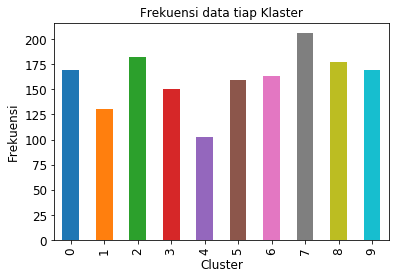

In [45]:
ax = res_.groupby('labels')['labels'].count()
ax = ax.plot(kind='bar', title ="Frekuensi data tiap Klaster", fontsize=12)
ax.set_xlabel("Cluster", fontsize=12)
ax.set_ylabel("Frekuensi", fontsize=12)

In [46]:
res_.groupby('labels')['labels'].count()

labels
0    169
1    130
2    182
3    150
4    103
5    159
6    163
7    206
8    177
9    169
Name: labels, dtype: int64

In [47]:
clf10.inertia_

24249523566.165886

# Drawing Centroid

In [48]:
centers = np.array(clf10.cluster_centers_)

In [49]:
centers.shape

(10, 100)

In [50]:
len(header_tfidf), res_.shape

(17216, (1608, 17216))

In [51]:
tempres = res_
tempres.columns =header_tfidf

In [52]:
#karna val object -> jadiin float dulu :(
tempres = tempres.astype(str).astype(float)

## Print significant word each cluster

In [ ]:
for row in range(10):
    resrow = tempres[tempres['labels'] == row]
    x = resrow.iloc[:,1:-1]
    #column with max value each row
    aa = x.idxmax(axis=1)
    aa = aa.to_frame()
    aa.columns=["word"]
    hasilrow = aa.groupby('word')['word'].count().sort_values(ascending=False)
    print('\n==================')
    print('cluster:\t', row,'\n')
    print(hasilrow.head(5))

## Combine with long lat

In [ ]:
csvNew.columns

In [53]:
aa = csvNew.rename(columns={0: "GlobalEventId"})
#aa

In [62]:
long_lat_header = ["GlobalEventId","ActionGeo_Lat","ActionGeo_Long", "ActionGeo_FullName", "Year"]
long_lat = data_gdelt[long_lat_header]
#long_lat['GlobalEventId'] = pd.to_numeric(long_lat['GlobalEventId'])
#long_lat

In [58]:
aa['GlobalEventId'] = pd.to_numeric(aa['GlobalEventId'])
#aa

In [63]:
comb = pd.merge(long_lat, aa, on=['GlobalEventId'])
comb

,GlobalEventId,ActionGeo_Lat,ActionGeo_Long,ActionGeo_FullName,Year,labels
0,719024886,7.38778,3.89639,"Ibadan, Oyo, Nigeria",2017,4
1,719024996,24.64080,46.77280,"Riyadh, Ar Riya?, Saudi Arabia",2018,4
2,719025118,31.18010,-91.87490,"Louisiana, United States",2018,4
3,719025368,14.10000,-87.21670,"Tegucigalpa, Francisco MorazÃÂ¡HO, Honduras",2018,4
4,719025401,33.50000,48.50000,"Lorestan, Lorestan, Iran",2018,4
5,719025402,33.21030,-117.39300,"Camp Pendleton, California, United States",2018,4
6,719025432,39.07240,-76.79020,"Maryland, United States",2018,4
7,719025761,7.38778,3.89639,"Ibadan, Oyo, Nigeria",2018,4
8,719025832,40.39530,49.88220,"Baku, Baki*, Azerbaijan",2018,4
9,719025833,37.28080,49.58320,"Rasht, Gilan, Iran",2018,4


In [60]:
comb_header = ["GlobalEventId", "ActionGeo_lat", "ActionGeo_Long", "ActionGeo_FullName", "Year", "labels"]
comb.to_csv("longlatlabel.csv", index=False, header = comb_header, mode='w')

In [61]:
terms = header_tfidf[1:-1]

original = pca.inverse_transform(clf10.cluster_centers_)
centroids = original.argsort()[:,::-1]
for i in range(10):
    print("Cluster %d:" %i),
    for ind in centroids[i, :10]:
        print(' %s' % terms[ind]),
    print

Cluster 0:
 aadmi
 saidu
 yearandrew
 policeman
 stategroup
 trumpa
 iranian
 government
 altaf
 killedmonday
Cluster 1:
 aadmi
 saidu
 yearandrew
 pakistandonald
 trumpa
 policeman
 pepe
 killedmonday
 accusationschrissi
 stategroup
Cluster 2:
 aadmi
 saidu
 yearandrew
 pepe
 presidenti
 policeman
 herat
 altaf
 kapuwa
 government
Cluster 3:
 aadmi
 saidu
 pakistandonald
 yearandrew
 stategroup
 trumpa
 policeman
 government
 pepe
 iranian
Cluster 4:
 aadmi
 saidu
 protestersiran
 pepe
 yearandrew
 government
 policeman
 iranian
 stategroup
 killedmonday
Cluster 5:
 aadmi
 saidu
 yearandrew
 government
 pepe
 stategroup
 policeman
 wound
 altaf
 presidenti
Cluster 6:
 aadmi
 saidu
 trumpa
 pakistandonald
 presidenti
 yearandrew
 government
 protestersiran
 stategroup
 pepe
Cluster 7:
 aadmi
 saidu
 yearandrew
 trumpa
 stategroup
 pakistandonald
 iranian
 pepe
 government
 presidenti
Cluster 8:
 aadmi
 saidu
 government
 yearandrew
 stategroup
 policeman
 altaf
 reportedli
 pepe
 presi

In [58]:
centroids

array([[    0, 16616, 13308, ...,  9361,  7768,  2532],
       [    0, 13308, 15885, ...,  9993,  6343, 12233],
       [    0, 13308, 16616, ...,  3874, 17258,  4507],
       ...,
       [    0, 13308, 16616, ...,  5584,  6247, 13548],
       [    0, 13308, 16616, ...,  5958, 13224,  9940],
       [    0, 16616, 13308, ...,  9529,  3699,  1178]], dtype=int64)

In [4]:
stop=['aa','ab','ac','ad','ag','ah','aj','al','ap','au','av','aw','az','bd','bi','bl','bn','bp','br','bs','bu','ca','cb','cc','cd','cg','cm','co','cp','cr','ct','cv','da','dc','de','dg','dh','dj','dq','dr','ds','dt','dw','eb','ed','eg','el','en','er','es','et','eu','ev','ex','fa','fb','fe','fl','fn','ft','fu','ga','gf','gm','go','gq','gu','ha','hi','hl','hp','hr','id','ie','ig','ii','il','io','ir','iv','jd','jn','jo','jr','ki','kl','km','ko','kp','ks','ku','ky','la','lc','le','li','lo','lt','lu','ly','lz','mb','mi','mm','mo','mp','mr','ms','na','nb','nd','ne','np','ny','oh','oi','ok','op','os','ot','pa','pb','pc','pg','pm','po','pp','pr','ps','py','ra','rc','rd','rk','rl','rm','rn','ro','rs','rt','ry','sa','sc','se','si','sm','sp','sr','st','su','sw','sy','th','tt','tv','tw','tx','uk','un','ur','us','vi','vr','vs','vt','vu','wa','wh','wm','xi','ye','ze','aaf','aam','aap','abc','abd','abl','abp','abu','acd','ace','acn','acr','act','adc','add','adj','adm','ado','adv','afp','age','agf','ago','ahm','aia','aib','aid','aim','air','aka','ali','alp','ami','ana','anc','ani','ann','ant','apc','apd','app','apr','apt','arm','art','arz','ash','ask','aso','atc','ate','atm','aud','aug','ave','avi','axi','ayg','ayo','bab','bad','bag','bai','ban','bar','bay','bbb','bbc','bcm','bed','bee','beg','ben','bet','bev','bfv','bhd','bia','bid','big','bin','bit','bjp','bla','bna','bnd','bob','bog','bon','boo','bot','bow','box','boy','bpl','bri','bsp','bud','bui','bun','buy','bvn','bye','cap','car','cat','cbc','cbi','cbn','ccb','cct','cdc','cdu','ceo','cfo','cgk','chi','cia','cio','cjm','cnc','cnn','cnp','coa','cod','col','com','cop','cow','cox','coy','cpc','cpe','cpn','cri','crm','csl','css','ctd','cue','cuf','cul','cum','cup','cur','cut','cyr','dad','dal','dam','dan','day','dea','deb','dec','ded','dem','der','dha','dia','die','dig','dim','din','dip','dmc','dmv','dna','dnc','doe','dog','dot','dou','dow','dpa','dpo','dpp','drc','dri','dsp','dub','due','dug','duo','dup','duy','dwi','ear','eas','eat','ebb','ebc','ebu','edg','edi','edo','edu','eel','eeu','efe','egg','ego','eir','ejk','eke','ela','elk','els','end','eng','eni','epa','era','esa','esb','est','eta','etc','eve','ext','eye','fan','far','fat','fay','fbi','fco','fct','fdi','fdp','fdr','feb','fec','fed','fee','fir','fit','fix','fla','fli','flt','fmt','fod','foe','fog','fox','frm','fro','fsa','fsb','fsp','fta','fun','gal','gao','gap','gay','gdp','ged','gen','geo','get','gil','gin','gmd','gmt','goa','god','goe','gop','got','gov','goy','gru','gst','gul','gun','gut','guy','gym','hai','ham','han','haq','har','hat','hay','hem','hen','hip','hit','hiv','hja','hmd','hoc','hop','hot','hoy','hrd','htc','htm','hua','hue','hug','hum','hut','hye','ian','iap','ice','ici','idn','idp','iec','ife','iga','iii','ike','ilk','ill','imf','imo','inc','ind','ing','ink','inn','ipx','irk','irv','ish','isi','ism','isp','ist','isu','ita','ite','ivi','iwa','iwo','iym','jab','jam','jan','jaw','jay','jbn','jcc','jeb','jeh','jet','jew','jim','jjw','jmb','jnu','job','joe','jog','joy','jpg','jsc','jul','jun','kan','kba','kbc','kbd','kbp','kda','keg','key','kgb','kid','kim','kin','kip','kit','kkk','kwd','lab','lag','lap','law','lay','led','lee','leg','lei','len','leo','let','lhc','lib','lie','lin','lip','lit','liu','lix','llc','lob','log','loi','lok','lot','low','lpg','lsd','lsu','ltd','luc','lug','lui','mac','mad','mag','maj','man','map','mar','max','may','mca','mcd','mda','mdc','mef','mel','men','met','mid','min','mix','mkz','mla','mmn','mna','mob','moh','moi','mom','mon','mop','mpa','mpd','mph','mqm','msm','mtn','mud','mug','mum','nac','nan','nbc','nbp','ncp','nda','ndc','nec','ned','neg','neo','net','new','nhl','nio','nip','nma','nmi','nod','non','nov','npc','npn','npp','npr','npt','nrl','nsa','nsg','nsw','ntv','nup','nwc','nye','oak','oar','oat','oba','obc','obi','oct','odd','odm','oil','ojo','oke','old','omr','onc','one','onr','onu','opl','opt','ore','org','osd','owe','oye','oyo','pad','pak','pan','pat','pay','pbh','pcc','pcp','pda','pdf','pdp','peg','pen','per','pet','pew','pez','pfm','phb','phd','phi','pic','pie','pig','pin','pio','pit','pjz','plo','plu','pml','pnm','poa','poe','pop','pot','ppa','ppp','pra','pre','pro','prp','ptf','pti','pub','pul','put','pvt','qar','quo','rae','raf','raj','ram','ran','rap','raw','ray','rea','red','rel','rep','rev','rex','rfe','rhi','rid','rig','rio','rjd','rob','rot','row','roy','rub','rue','run','sac','sad','sam','san','sap','sar','sat','saw','say','sbu','scf','sci','sea','see','sen','sep','set','sex','sgf','sgt','shi','sho','sic','sig','sim','sin','sir','sit','six','sky','smc','sol','som','son','sop','spa','spi','sri','ssa','ssp','sss','sst','sta','std','sti','sub','sue','sum','sun','suv','svr','sze','tad','tag','tap','tat','tax','tea','ted','tek','tel','ten','tet','tha','thi','thu','tie','tim','tip','tit','tmz','toe','toi','tom','ton','top','toy','tpp','tre','tri','tsc','tun','two','twp','uae','uft','ula','uml','una','unc','uon','upi','upn','urg','uri','url','usa','usd','use','usp','ute','vai','van','vat','vaz','vcg','ved','vee','vet','vfa','via','vie','vip','von','vow','vvt','vya','wag','wai','war','wat','way','web','wed','wen','wew','whi','win','wit','wmd','wnw','woe','woh','woo','wow','wsb','www','yar','ydp','ydr','yea','yet','yun','yve','zip','zou']

In [5]:
stop_words.update(stop)

In [7]:
del res

NameError: name 'res' is not defined